In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="B1EZEOmtv18Nlzw4TSSr")
project = rf.workspace("dlfoodfreshness").project("dl-food-freshness-szirk")
version = project.version(3)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 78.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 127.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Dl-Food-Freshness-3 in yolov8:: 100%|██████████| 1536/1536 [00:00<00:00, 6098.95it/s]


In [ ]:
# --- Step 1: Install required libraries ---
!pip install ultralytics roboflow --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 54.5 MB/s eta 0:00:00


In [ ]:
!ls /content
!ls /content/Dl-Food-Freshness-3


Dl-Food-Freshness-3  drive  sample_data
data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
# List folder contents
!ls /content/Dl-Food-Freshness-3

# Check number of images per split
import glob
for split in ['train', 'valid', 'test']:
    n = len(glob.glob(f'/content/Dl-Food-Freshness-3/{split}/images/*'))
    print(f"{split}: {n} images")


data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid
train: 666 images
valid: 63 images
test: 33 images


In [ ]:
from ultralytics import YOLO

# Load YOLOv8n model
model = YOLO("yolov8s.pt") # YOLOv8 small from ultralytics import YOLO

model = YOLO("yolov8s.pt")

results = model.train(
    data="/content/Dl-Food-Freshness-3/data.yaml",
    epochs=80,
    batch=8,
    mosaic=1.0,          # build synthetic multi-tomato scenes
    copy_paste=0.5,      # paste tomatoes from other images
    mixup=0.3,           # light blending
    weight_decay=0.001,  # prevents memorization
    dropout=0.2,         # regularization
    patience=15,         # early stop before overfit
    device=0,
    name="freshness_yolov8s_overlapped",
    project="runs/train",           # output folder
)



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
New https://pypi.org/project/ultralytics/8.3.226 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.5, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Dl-Food-Freshness-3/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.2, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fract

In [ ]:
# Evaluate on test set
metrics = model.val(data="/content/Dl-Food-Freshness-3/data.yaml", batch=8, device=0)
print(metrics)


Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 978.2±399.5 MB/s, size: 43.0 KB)
val: Scanning /content/Dl-Food-Freshness-3/valid/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 108.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s
                   all         63         64      0.934      0.936      0.984      0.926
                 fresh         36         37       0.94      0.946      0.984      0.926
                spoilt         27         27      0.928      0.926      0.983      0.926
Speed: 5.0ms preprocess, 11.1ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /content/runs/detect/val2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.

# MODEL 2 spoilt augmentation

In [ ]:
import os
import cv2
import uuid
import shutil
import random
import numpy as np
from tqdm import tqdm
from albumentations import (
    Compose, HorizontalFlip, RandomBrightnessContrast, Rotate, Affine,
    HueSaturationValue, GaussNoise
)

# ==============================
# CONFIGURATION
# ==============================
dataset_root = "Dl-Food-Freshness-2"
augmented_root = "Dl-Food-Freshness-2-augmented"
splits = ["train", "valid", "test"]
SPOILT_CLASS = 1        # YOLO class ID for 'spoilt'
AUG_MULTIPLIER = 5      # how many new images to create per spoilt sample

# Albumentations pipeline (bbox-aware)
augmentations = Compose([
    HorizontalFlip(p=0.5),
    RandomBrightnessContrast(p=0.5),
    Rotate(limit=20, p=0.5),
    Affine(translate_percent=(0.1, 0.1), scale=(0.9, 1.1), rotate=(-15, 15), p=0.5),
    HueSaturationValue(p=0.4),
    GaussNoise(p=0.3)
], bbox_params={'format': 'yolo', 'label_fields': ['class_labels'], 'min_visibility': 0.3})

# Reproducibility
random.seed(42)
np.random.seed(42)

os.makedirs(augmented_root, exist_ok=True)

# ==============================
# MAIN LOOP
# ==============================
for split in splits:
    print(f"\nProcessing split: {split}")

    images_src = os.path.join(dataset_root, split, "images")
    labels_src = os.path.join(dataset_root, split, "labels")

    images_dst = os.path.join(augmented_root, split, "images")
    labels_dst = os.path.join(augmented_root, split, "labels")

    os.makedirs(images_dst, exist_ok=True)
    os.makedirs(labels_dst, exist_ok=True)

    # Copy all original images and labels
    for img_file in tqdm(os.listdir(images_src), desc=f"Copying originals ({split})"):
        src_img = os.path.join(images_src, img_file)
        src_lbl = os.path.join(labels_src, img_file.replace(".jpg", ".txt"))
        if not os.path.exists(src_lbl):
            continue
        shutil.copy(src_img, images_dst)
        shutil.copy(src_lbl, labels_dst)

    # Augment spoilt class
    spoilt_files = []
    for lbl_file in os.listdir(labels_src):
        lbl_path = os.path.join(labels_src, lbl_file)
        with open(lbl_path, "r") as f:
            lines = f.readlines()
            if any(int(l.split()[0]) == SPOILT_CLASS for l in lines):
                spoilt_files.append(lbl_file)

    print(f"Found {len(spoilt_files)} spoilt-class label files in '{split}' set.")

    for lbl_file in tqdm(spoilt_files, desc=f"Augmenting spoilt ({split})"):
        label_path = os.path.join(labels_src, lbl_file)
        img_file = lbl_file.replace(".txt", ".jpg")
        img_path = os.path.join(images_src, img_file)
        img = cv2.imread(img_path)
        if img is None:
            continue

        with open(label_path, "r") as f:
            lines = [line.strip().split() for line in f.readlines()]

        bboxes = [list(map(float, l[1:])) for l in lines]
        class_labels = [int(l[0]) for l in lines]

        for i in range(AUG_MULTIPLIER):
            augmented = augmentations(image=img, bboxes=bboxes, class_labels=class_labels)
            aug_img = augmented["image"]
            aug_bboxes = augmented["bboxes"]
            aug_classes = augmented["class_labels"]

            # Skip if no boxes visible
            if len(aug_bboxes) == 0:
                continue

            new_name = f"{uuid.uuid4().hex}.jpg"
            new_label = new_name.replace(".jpg", ".txt")

            cv2.imwrite(os.path.join(images_dst, new_name), aug_img)

            with open(os.path.join(labels_dst, new_label), "w") as f:
                for cls, bbox in zip(aug_classes, aug_bboxes):
                    f.write(f"{cls} {' '.join(map(str, bbox))}\n")

    print(f"✅ Completed {split} split. Generated {AUG_MULTIPLIER}x more spoilt samples.")



Processing split: train


Copying originals (train): 100%|██████████| 255/255 [00:00<00:00, 3959.10it/s]


Found 30 spoilt-class label files in 'train' set.


Augmenting spoilt (train): 100%|██████████| 30/30 [00:01<00:00, 16.24it/s]


✅ Completed train split. Generated 5x more spoilt samples.

Processing split: valid


Copying originals (valid): 100%|██████████| 15/15 [00:00<00:00, 1886.27it/s]


Found 1 spoilt-class label files in 'valid' set.


Augmenting spoilt (valid): 100%|██████████| 1/1 [00:00<00:00, 17.50it/s]


✅ Completed valid split. Generated 5x more spoilt samples.

Processing split: test


Copying originals (test): 100%|██████████| 10/10 [00:00<00:00, 1854.82it/s]


Found 1 spoilt-class label files in 'test' set.


Augmenting spoilt (test): 100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

✅ Completed test split. Generated 5x more spoilt samples.


In [ ]:
!pip install ultralytics --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.9 MB/s eta 0:00:00


In [ ]:
!cp /content/Dl-Food-Freshness-2/data.yaml /content/Dl-Food-Freshness-2-augmented/data.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8s.pt")
model.train(
    data="/content/Dl-Food-Freshness-2-augmented/data.yaml",
    epochs=70,
    imgsz=416,
    batch=8,
    device=0,
    name="freshness_yolov8s_balanced_aug",
    project="runs/train",
    augment=True,
    patience=10,   # early stopping
    save_period=10
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Dl-Food-Freshness-2-augmented/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, i

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ed5e4313740>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
metrics = model.val(
    data="/content/Dl-Food-Freshness-2-augmented/data.yaml",
    split="test",   # or "val"
    imgsz=416,
    batch=8
)
print(metrics)


Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1139.0±947.9 MB/s, size: 56.6 KB)
val: Scanning /content/Dl-Food-Freshness-2-augmented/test/labels... 15 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 15/15 1.7Kit/s 0.0s
val: New cache created: /content/Dl-Food-Freshness-2-augmented/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 5.8it/s 0.3s
                   all         15         16      0.789      0.783      0.833      0.559
                 fresh          9         10      0.929        0.9      0.986      0.736
                spoilt          6          6      0.649      0.667       0.68      0.383
Speed: 3.3ms preprocess, 13.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /content/runs/detect/val
ultralytic


image 1/1 /content/IMG20251101223644.jpg: 416x320 1 spoilt, 43.7ms
Speed: 2.2ms preprocess, 43.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 320)


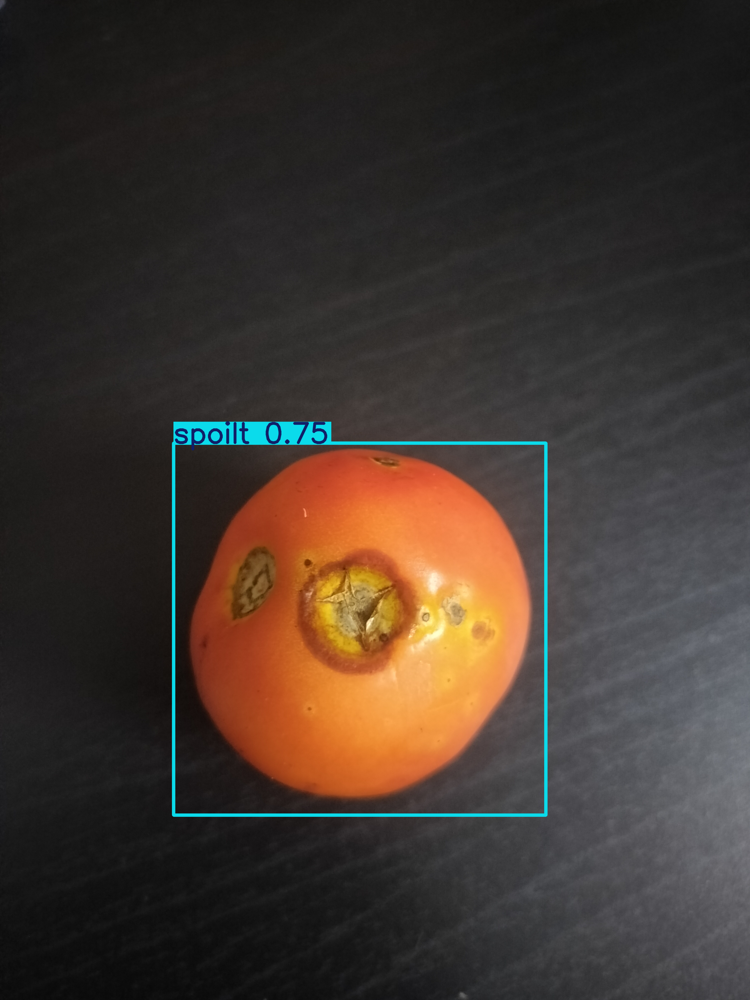

In [ ]:
# Path to test image
image_path = "/content/IMG20251101223644.jpg"

# Run prediction
results = model.predict(source=image_path, imgsz=416, conf=0.25)

# Show result inline
results[0].show()

# Optional: save output image
# results[0].save(filename="output.jpg")


In [ ]:


from google.colab import drive
import shutil
import os

# 1️⃣ Mount your Google Drive
drive.mount('/content/drive')

# 2️⃣ Path to your trained model
# (update this if your run name or project folder is different)
source_path = '/content/runs/train/freshness_yolov8s_balanced_aug/weights/best.pt'

# 3️⃣ Destination path in Drive
# You can rename "YOLO_Models" or "freshness_best.pt" as you like
destination_folder = '/content/drive/MyDrive/YOLO_Models'
os.makedirs(destination_folder, exist_ok=True)
destination_path = os.path.join(destination_folder, 'freshness_best.pt')

# 4️⃣ Copy model to Drive
shutil.copy(source_path, destination_path)

print(f"✅ Model saved successfully to: {destination_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model saved successfully to: /content/drive/MyDrive/YOLO_Models/freshness_best.pt
